In [5]:
import sys
sys.path.append("/n/home12/binxuwang/Github/Neuro-ActMax-GAN-comparison")

In [6]:
""" Cluster version of BigGAN Evol """
import re
import glob
import os
import sys
sys.path.append(os.path.join(os.getcwd(), '..'))
from tqdm import tqdm, trange
import pandas as pd
import numpy as np
from os.path import join
import matplotlib.pylab as plt
import seaborn as sns
import torch
import torch.nn.functional as F
from torchvision.transforms import ToPILImage, ToTensor
from torchvision.utils import make_grid
from pytorch_pretrained_biggan import (BigGAN, truncated_noise_sample, one_hot_from_names, save_as_images)
from core.utils.CNN_scorers import TorchScorer
from core.utils.GAN_utils import BigGAN_wrapper, upconvGAN, loadBigGAN
from core.utils.grad_RF_estim import grad_RF_estimate, gradmap2RF_square
from core.utils.layer_hook_utils import get_module_names, layername_dict, register_hook_by_module_names, get_module_name_shapes
from core.utils.Optimizers import CholeskyCMAES, HessCMAES, ZOHA_Sphere_lr_euclid
import scipy.stats as stats
from scipy.stats import sem
from core.utils.stats_utils import shaded_errorbar

def group_stats_by_gen(generations, value, funcs=[np.mean, sem]):
    gen_slice = np.arange(min(generations), max(generations) + 1)
    mean_score = np.zeros((gen_slice.shape[0], value.shape[1]))
    sem_score = np.zeros((gen_slice.shape[0], value.shape[1]))
    max_score = np.zeros((gen_slice.shape[0], value.shape[1]))
    for i, geni in enumerate(gen_slice):
        mean_score[i, :] = np.mean(value[generations == geni], axis=0)
        sem_score[i, :] = sem(value[generations == geni], axis=0)
        max_score[i, :] = np.max(value[generations == geni])
    return gen_slice, mean_score, sem_score, max_score



### Fetch All Table

In [7]:
from core.utils.montage_utils import crop_from_montage

In [8]:
saveroot = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp"
syndir = join(saveroot, "synopsis")
os.makedirs(syndir, exist_ok=True)

In [13]:
!echo $STORE_DIR/Projects/Evol_lrm_GAN_cmp

/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Projects/Evol_lrm_GAN_cmp


In [12]:
!ls {saveroot}/alexnet_lrm3* -d

/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-conv1_relu-Ch0000_RFrsz
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-conv1_relu-Ch0001_RFrsz
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-conv1_relu-Ch0002_RFrsz
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-conv1_relu-Ch0003_RFrsz
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-conv1_relu-Ch0004_RFrsz
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-conv1_relu-Ch0005_RFrsz
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-conv1_relu-Ch0006_RFrsz
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-conv1_relu-Ch0007_RFrsz
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-conv1_relu-Ch000

#### LRM1

In [14]:
saveroot = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Projects/Evol_lrm_GAN_cmp"
# saveroot = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp"
syndir = join( r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp", "synopsis")
os.makedirs(syndir, exist_ok=True)

In [ ]:
!ls $STORE_DIR/Projects/Evol_lrm_GAN_cmp

alexnet_lrm1-fc7_relu-Ch0000  alexnet_lrm2-fc6_relu-Ch0013
alexnet_lrm1-fc7_relu-Ch0001  alexnet_lrm2-fc6_relu-Ch0014
alexnet_lrm1-fc7_relu-Ch0002  alexnet_lrm2-fc6_relu-Ch0015
alexnet_lrm1-fc7_relu-Ch0003  alexnet_lrm2-fc6_relu-Ch0016
alexnet_lrm1-fc7_relu-Ch0004  alexnet_lrm2-fc6_relu-Ch0017
alexnet_lrm1-fc7_relu-Ch0005  alexnet_lrm2-fc6_relu-Ch0018
alexnet_lrm1-fc7_relu-Ch0006  alexnet_lrm2-fc6_relu-Ch0019
alexnet_lrm1-fc7_relu-Ch0007  alexnet_lrm2-fc6_relu-Ch0020
alexnet_lrm1-fc7_relu-Ch0008  alexnet_lrm2-fc6_relu-Ch0021
alexnet_lrm1-fc7_relu-Ch0009  alexnet_lrm2-fc6_relu-Ch0022
alexnet_lrm1-fc7_relu-Ch0010  alexnet_lrm2-fc6_relu-Ch0023
alexnet_lrm1-fc7_relu-Ch0011  alexnet_lrm2-fc6_relu-Ch0024
alexnet_lrm1-fc7_relu-Ch0012  alexnet_lrm2-fc7_relu-Ch0000
alexnet_lrm1-fc7_relu-Ch0013  alexnet_lrm2-fc7_relu-Ch0001
alexnet_lrm1-fc7_relu-Ch0014  alexnet_lrm2-fc7_relu-Ch0002
alexnet_lrm1-fc7_relu-Ch0015  alexnet_lrm2-fc7_relu-Ch0003
alexnet_lrm1-fc7_relu-Ch0016  alexnet_lrm2-fc7_relu-Ch00

In [15]:
df_col = []
netname = r"alexnet_lrm2"
# "conv1_relu","conv2_relu","conv3_relu",
for layerkey in ["fc6_relu", "fc7_relu", ]:#"conv2_relu","conv3_relu","conv4_relu","conv5_relu","fc8", 
    for iChannel in trange(25): #range(25):
        if layerkey in ["conv1_relu", "conv2_relu", "conv3_relu",]:
            savedir = join(saveroot, f"{netname}-{layerkey}-Ch{iChannel:04d}_RFrsz")
        else:
            savedir = join(saveroot, f"{netname}-{layerkey}-Ch{iChannel:04d}")
        jpgfiles = glob.glob(join(savedir, "besteachgen*.jpg"))
        for iT in [0, 1, 2, 3]:
            for GANname in ["BigGAN", "fc6", ]:
                methodlab = f"{GANname}_CMAES_T{iT}"
                # search for files with the naming "scores%s_%05d.npz" % (methodlab, RND)
                pattern = re.compile(r"besteachgen%s_(\d+).jpg" % (methodlab,))
                jpgfile_GAN = [f for f in jpgfiles if pattern.search(f)]
                for jpgfile in jpgfile_GAN:
                    RND = int(pattern.search(jpgfile).group(1))
                    title_str = f"{netname} {layerkey} Ch{iChannel} {methodlab} RND {RND}"
                    mtg = plt.imread(jpgfile)
                    finalimg = crop_from_montage(mtg, -1)
                    npzfile = join(savedir, f"scores{methodlab}_{RND:05d}.npz")
                    data = np.load(npzfile)
                    generations = data["generations"]
                    scores_all = data["scores_all"]
                    scores_dyn_all = data["scores_dyn_all"]
                    gen_slice, mean_score, sem_score, max_score = group_stats_by_gen(generations, scores_dyn_all)
                    finalscore = mean_score[-1, iT]
                    df_col.append({"network": netname, "layerkey": layerkey, "iChannel": iChannel, "iT": iT, "GANname": GANname,
                                "methodlab": methodlab, "RND": RND, "finalimg": finalimg, "finalscore": finalscore, 
                                "gen_slice": gen_slice, "mean_score": mean_score, "sem_score": sem_score, "max_score": max_score})
df_img = pd.DataFrame(df_col)


  0%|          | 0/25 [00:00<?, ?it/s]/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/core/_methods.py:264: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
100%|██████████| 25/25 [02:16<00:00,  5.46s/it]


In [16]:
df_img.to_pickle(join(syndir, f"{netname}_df_img.pkl"))

In [17]:
df_col = []
netname = r"alexnet_lrm1"
# "conv1_relu","conv2_relu","conv3_relu",
for layerkey in ["fc7_relu", ]:#"fc6_relu", "conv2_relu","conv3_relu","conv4_relu","conv5_relu","fc8", 
    for iChannel in trange(25): #range(25):
        if layerkey in ["conv1_relu", "conv2_relu", "conv3_relu",]:
            savedir = join(saveroot, f"{netname}-{layerkey}-Ch{iChannel:04d}_RFrsz")
        else:
            savedir = join(saveroot, f"{netname}-{layerkey}-Ch{iChannel:04d}")
        jpgfiles = glob.glob(join(savedir, "besteachgen*.jpg"))
        for iT in [0, 1, 2, 3]:
            for GANname in ["BigGAN", "fc6", ]:
                methodlab = f"{GANname}_CMAES_T{iT}"
                # search for files with the naming "scores%s_%05d.npz" % (methodlab, RND)
                pattern = re.compile(r"besteachgen%s_(\d+).jpg" % (methodlab,))
                jpgfile_GAN = [f for f in jpgfiles if pattern.search(f)]
                for jpgfile in jpgfile_GAN:
                    RND = int(pattern.search(jpgfile).group(1))
                    title_str = f"{netname} {layerkey} Ch{iChannel} {methodlab} RND {RND}"
                    mtg = plt.imread(jpgfile)
                    finalimg = crop_from_montage(mtg, -1)
                    npzfile = join(savedir, f"scores{methodlab}_{RND:05d}.npz")
                    data = np.load(npzfile)
                    generations = data["generations"]
                    scores_all = data["scores_all"]
                    scores_dyn_all = data["scores_dyn_all"]
                    gen_slice, mean_score, sem_score, max_score = group_stats_by_gen(generations, scores_dyn_all)
                    finalscore = mean_score[-1, iT]
                    df_col.append({"network": netname, "layerkey": layerkey, "iChannel": iChannel, "iT": iT, "GANname": GANname,
                                "methodlab": methodlab, "RND": RND, "finalimg": finalimg, "finalscore": finalscore, 
                                "gen_slice": gen_slice, "mean_score": mean_score, "sem_score": sem_score, "max_score": max_score})
df_img = pd.DataFrame(df_col)
df_img.to_pickle(join(syndir, f"{netname}_df_img.pkl"))

100%|██████████| 25/25 [02:20<00:00,  5.61s/it]


In [18]:
!ls {syndir}

alexnet_lrm1_df_img.pkl  alexnet_lrm2_df_img.pkl  df_img.pkl  figsummary


In [21]:
!du -sh {syndir}/*

200M	/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/synopsis/alexnet_lrm1_df_img.pkl
600M	/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/synopsis/alexnet_lrm2_df_img.pkl
1.6G	/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/synopsis/alexnet_lrm3_df_img.pkl
1.9G	/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/synopsis/figsummary


#### LRM3

In [9]:
df_col = []
# "conv1_relu","conv2_relu","conv3_relu",
for layerkey in ["conv1_relu","conv2_relu","conv3_relu","conv4_relu","conv5_relu","fc6_relu","fc7_relu", "fc8"]:
    for iChannel in trange(25): #range(25):
        if layerkey in ["conv1_relu","conv2_relu","conv3_relu",]:
            savedir = join(saveroot, f"alexnet_lrm3-{layerkey}-Ch{iChannel:04d}_RFrsz")
        else:
            savedir = join(saveroot, f"alexnet_lrm3-{layerkey}-Ch{iChannel:04d}")
        jpgfiles = glob.glob(join(savedir, "besteachgen*.jpg"))
        for iT in [0, 1, 2, 3]:
            for GANname in ["BigGAN", "fc6", ]:
                methodlab = f"{GANname}_CMAES_T{iT}"
                # search for files with the naming "scores%s_%05d.npz" % (methodlab, RND)
                pattern = re.compile(r"besteachgen%s_(\d+).jpg" % (methodlab,))
                jpgfile_GAN = [f for f in jpgfiles if pattern.search(f)]
                for jpgfile in jpgfile_GAN:
                    RND = int(pattern.search(jpgfile).group(1))
                    title_str = f"alexnet_lrm3 {layerkey} Ch{iChannel} {methodlab} RND {RND}"
                    mtg = plt.imread(jpgfile)
                    finalimg = crop_from_montage(mtg, -1)
                    npzfile = join(savedir, f"scores{methodlab}_{RND:05d}.npz")
                    data = np.load(npzfile)
                    generations = data["generations"]
                    scores_all = data["scores_all"]
                    scores_dyn_all = data["scores_dyn_all"]
                    gen_slice, mean_score, sem_score, max_score = group_stats_by_gen(generations, scores_dyn_all)
                    finalscore = mean_score[-1, iT]
                    df_col.append({"layerkey": layerkey, "iChannel": iChannel, "iT": iT, "GANname": GANname,
                                "methodlab": methodlab, "RND": RND, "finalimg": finalimg, "finalscore": finalscore, 
                                "gen_slice": gen_slice, "mean_score": mean_score, "sem_score": sem_score, "max_score": max_score})
df_img = pd.DataFrame(df_col)
df_img.to_pickle(join(syndir, "df_img.pkl"))



  0%|                                                                                                             | 0/25 [00:00<?, ?it/s]

/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/core/_methods.py:264: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
  8%|████████                                                                                             | 2/25 [00:12<02:20,  6.11s/it]

In [7]:
df_col = []
# "conv1_relu","conv2_relu","conv3_relu",
for layerkey in ["conv2_relu","conv3_relu","conv4_relu","conv5_relu","fc6_relu","fc7_relu", "fc8"]:
    for iChannel in trange(25): #range(25):
        if layerkey in ["conv1_relu","conv2_relu","conv3_relu",]:
            savedir = join(saveroot, f"alexnet_lrm3-{layerkey}-Ch{iChannel:04d}_RFrsz")
        else:
            savedir = join(saveroot, f"alexnet_lrm3-{layerkey}-Ch{iChannel:04d}")
        jpgfiles = glob.glob(join(savedir, "besteachgen*.jpg"))
        for iT in [0, 1, 2, 3]:
            for GANname in ["BigGAN", "fc6", ]:
                methodlab = f"{GANname}_CMAES_T{iT}"
                # search for files with the naming "scores%s_%05d.npz" % (methodlab, RND)
                pattern = re.compile(r"besteachgen%s_(\d+).jpg" % (methodlab,))
                jpgfile_GAN = [f for f in jpgfiles if pattern.search(f)]
                for jpgfile in jpgfile_GAN:
                    RND = int(pattern.search(jpgfile).group(1))
                    title_str = f"alexnet_lrm3 {layerkey} Ch{iChannel} {methodlab} RND {RND}"
                    mtg = plt.imread(jpgfile)
                    finalimg = crop_from_montage(mtg, -1)
                    npzfile = join(savedir, f"scores{methodlab}_{RND:05d}.npz")
                    data = np.load(npzfile)
                    generations = data["generations"]
                    scores_all = data["scores_all"]
                    scores_dyn_all = data["scores_dyn_all"]
                    gen_slice, mean_score, sem_score, max_score = group_stats_by_gen(generations, scores_dyn_all)
                    finalscore = mean_score[-1, iT]
                    df_col.append({"layerkey": layerkey, "iChannel": iChannel, "iT": iT, "GANname": GANname,
                                "methodlab": methodlab, "RND": RND, "finalimg": finalimg, "finalscore": finalscore, 
                                "gen_slice": gen_slice, "mean_score": mean_score, "sem_score": sem_score, "max_score": max_score})
df_img = pd.DataFrame(df_col)


100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [02:21<00:00,  5.65s/it]


In [8]:
df_img.to_pickle(join(syndir, "df_img.pkl"))

### Figure synopsis

In [10]:
!du -sh /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/synopsis

2.0G	/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/synopsis


In [29]:
import torch
model, transforms = torch.hub.load('harvard-visionlab/lrm-steering', 'alexnet_lrm3', pretrained=True, steering=True, force_reload=True)
print(model)

Downloading: "https://github.com/harvard-visionlab/lrm-steering/zipball/main" to /n/holylabs/LABS/kempner_fellows/Users/binxuwang/torch_cache/hub/main.zip


==> Loading weights for alexnet_lrm3, hash_id=63ab1b3b06
https://s3.us-east-1.wasabisys.com/visionlab-projects/dnn_feedback_dev/logs/set15/set15_alexnet_torchvision_imagenet1k_lrm_3back_2steps/28453e80-c5e5-4d76-bc81-99c5fade39ff/set15_alexnet_torchvision_imagenet1k_lrm_3back_2steps_final_weights-63ab1b3b06.pth
local_filename: /n/holylabs/LABS/kempner_fellows/Users/binxuwang/torch_cache/hub/set15_alexnet_torchvision_imagenet1k_lrm_3back_2steps_final_weights-63ab1b3b06.pth
<All keys matched successfully>
SteerableLRM(
  (feedforward): AlexNet(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (4): ReLU(inplace=True)
      (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (6): Conv2d(192, 384, kernel_

### Activation Trajectory Analysis

In [ ]:
df.norm_score = df.mean_score / df.mean_score.max(axis=1)[:, None]

In [ ]:
avg_traj = df.groupby(["iT", "GANname"]).agg({"mean_score":"mean"})

In [ ]:
avg_traj

mean_score
iT GANname                                                   
0  BigGAN   [[0.49930197298526763, 0.4758336037397385, 0.5...
   fc6      [[0.4070153073966503, 0.27158408142626284, 0.1...
1  BigGAN   [[0.49930197298526763, 0.4758336037397385, 0.5...
   fc6      [[0.40701780185103414, 0.2715958324819803, 0.1...
2  BigGAN   [[0.49930197298526763, 0.4758336037397385, 0.5...
   fc6      [[0.4070150016248226, 0.2715980771929026, 0.18...
3  BigGAN   [[0.49930197298526763, 0.4758336037397385, 0.5...
   fc6      [[0.40701545163989067, 0.2715980646759272, 0.1...

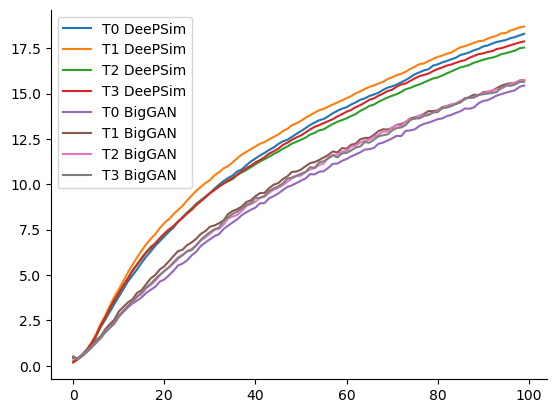

In [ ]:
plt.figure()
for iT in [0, 1, 2, 3]:
    plt.plot(avg_traj.loc[iT, "fc6"]["mean_score"][:, iT], label=f"T{iT} DeePSim")
for iT in [0, 1, 2, 3]:
    plt.plot(avg_traj.loc[iT, "BigGAN"]["mean_score"][:, iT], label=f"T{iT} BigGAN")
plt.legend()
plt.show()

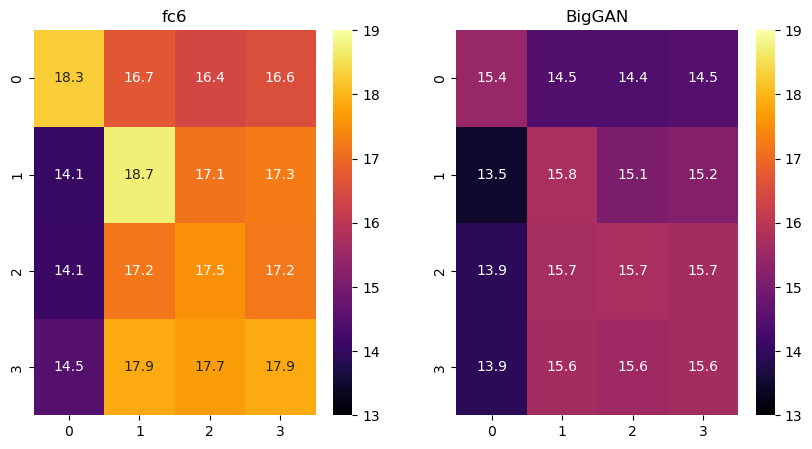

In [31]:
resp_dyn_mat = np.zeros((2, 4, 4, ))
for iT in [0, 1, 2, 3]:
    resp_dyn_mat[0, iT, :] = avg_traj.loc[iT, "fc6"]["mean_score"][-1, :]
    resp_dyn_mat[1, iT, :] = avg_traj.loc[iT, "BigGAN"]["mean_score"][-1, :]

figh, axs = plt.subplots(1, 2, figsize=(10, 5))
sns.heatmap(resp_dyn_mat[0], ax=axs[0], annot=True, fmt=".1f", cmap="inferno", vmin=13, vmax=19)#center=0)
axs[0].set_title("fc6")
sns.heatmap(resp_dyn_mat[1], ax=axs[1], annot=True, fmt=".1f", cmap="inferno", vmin=13, vmax=19)#center=0)
axs[1].set_title("BigGAN")
plt.show()

### Evol Image Analysis for LRM

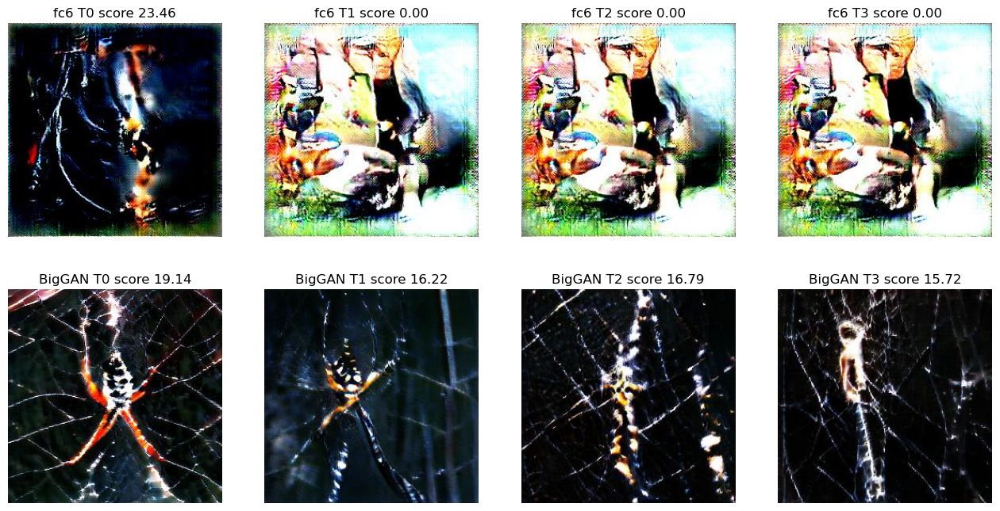

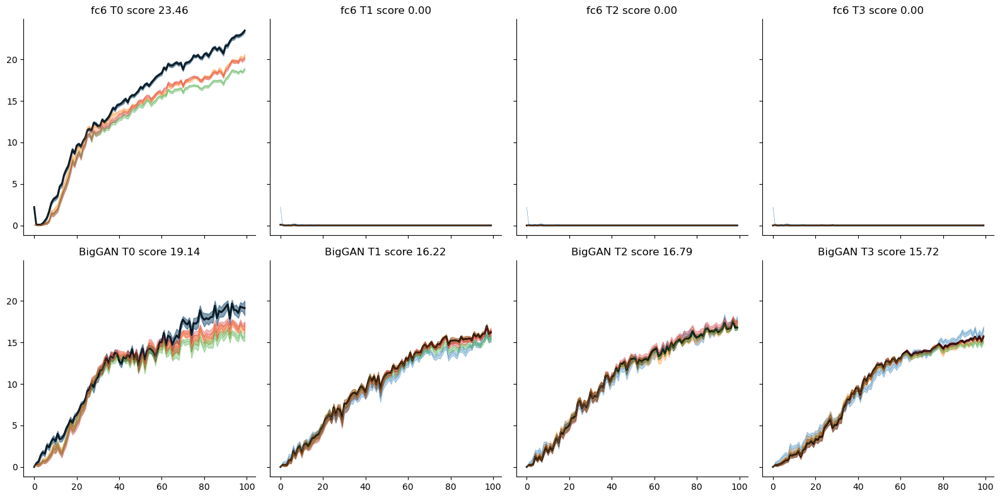

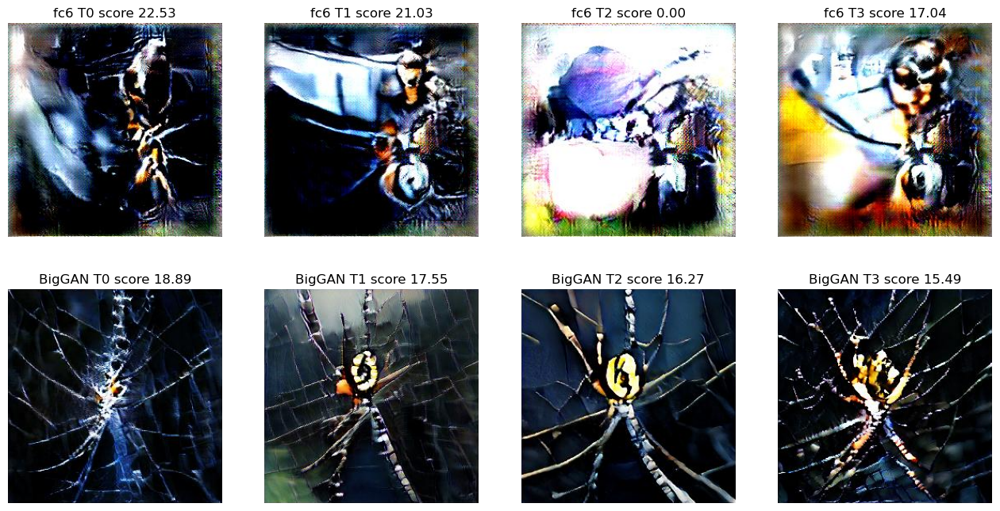

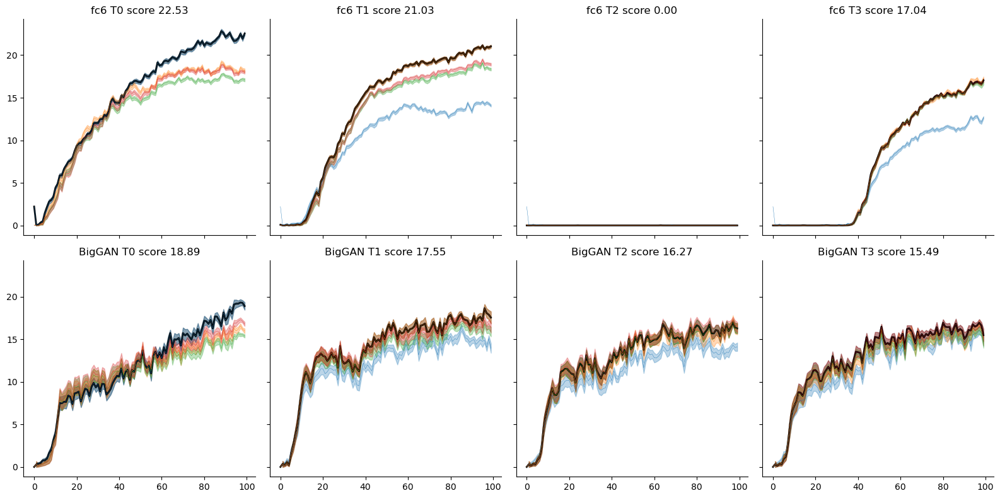

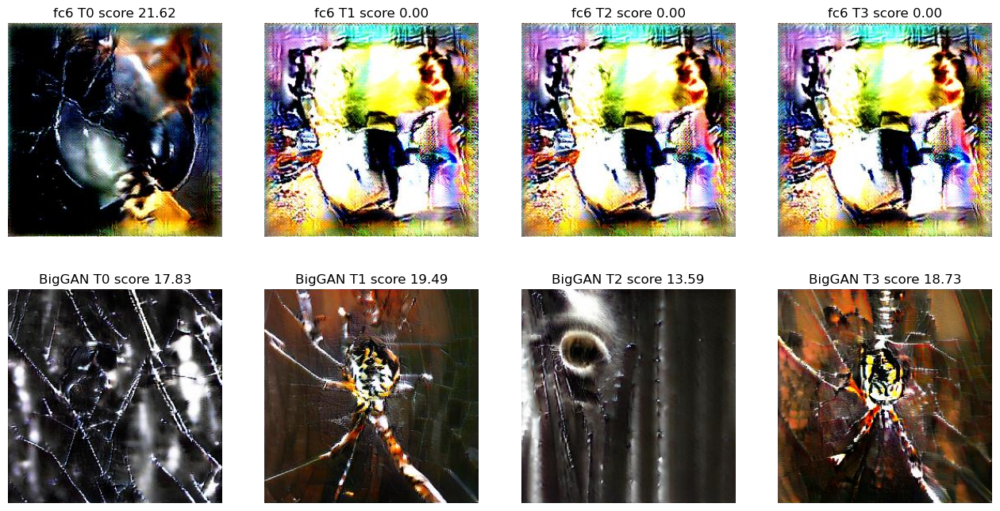

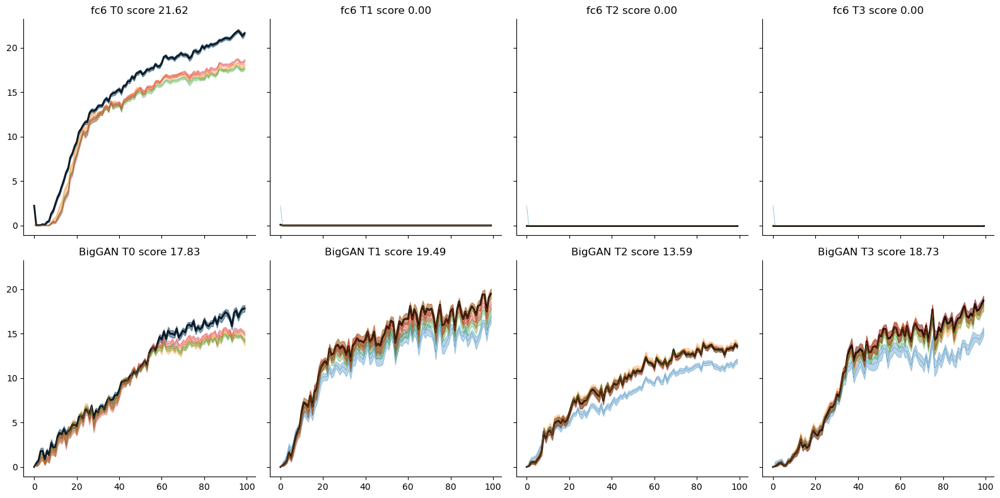

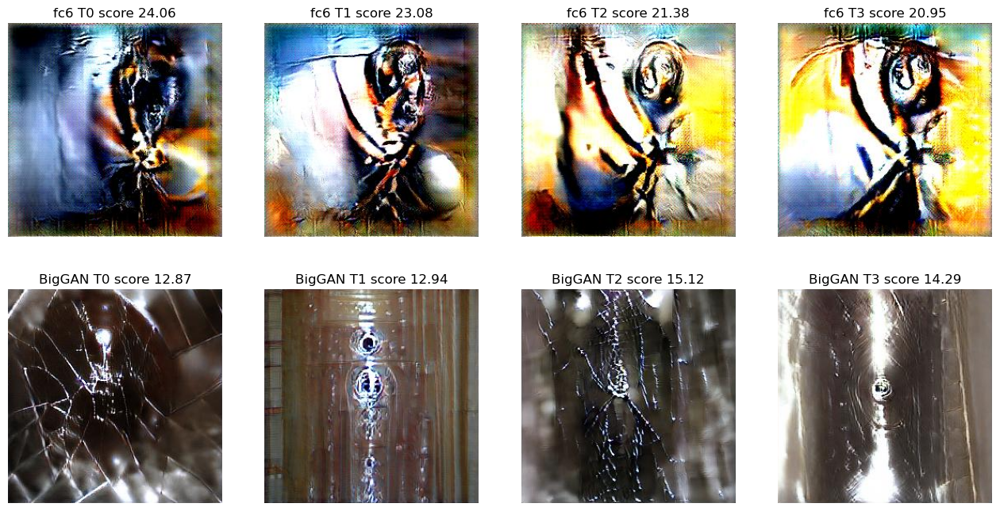

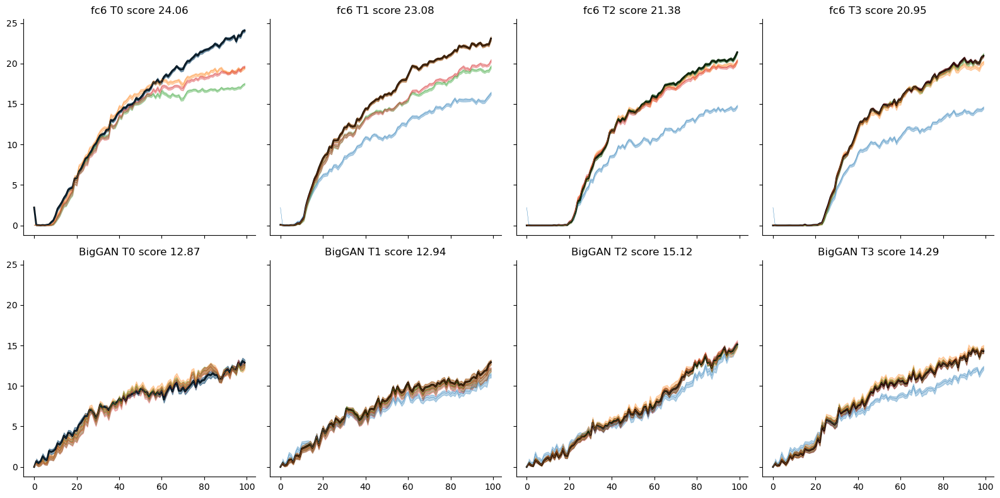

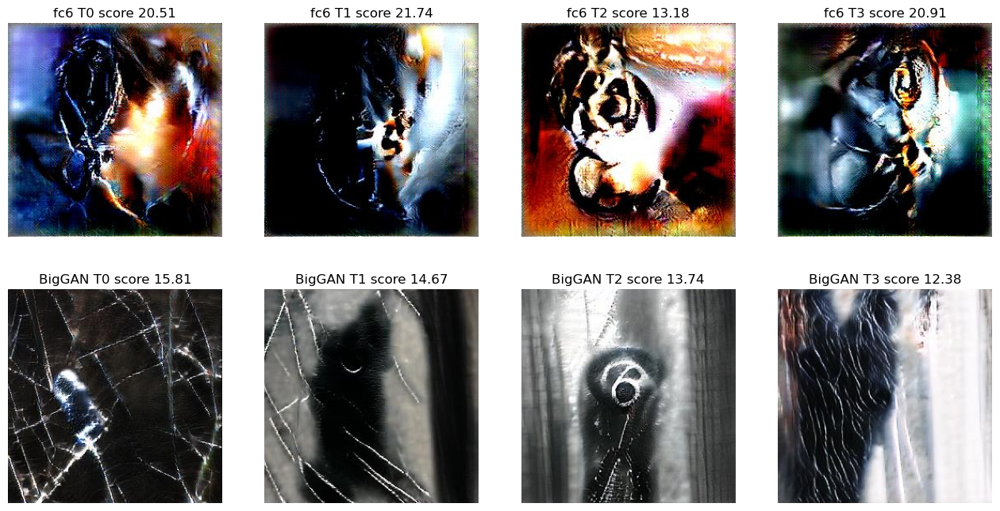

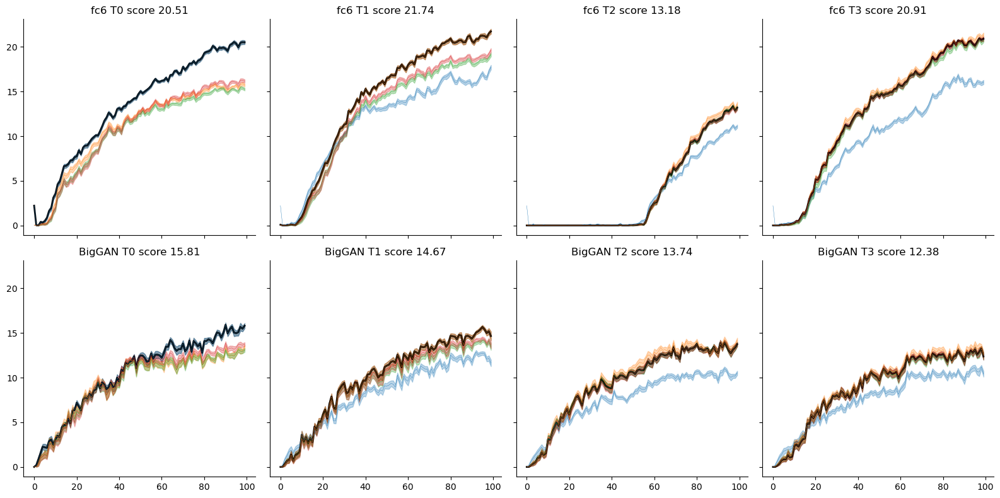

In [53]:
# make a montage of the final images
iCh = 24
layerkey = "fc6_relu"
layerkey, iCh = "fc6_relu", 2
layerkey, iCh = "conv4_relu", 5
layerkey, iCh = "fc7_relu", 10
for iRND in range(5):
    figh, axs = plt.subplots(2, 4, figsize=(16, 8))
    figh2, axs2  = plt.subplots(2, 4, figsize=(16, 8), sharex=True, sharey=True)
    for j, GANname in enumerate(["fc6", "BigGAN"]):
        fix_RND = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                         (df_img.iT == 0) & (df_img.GANname == GANname)].RND.values[iRND]
        for i, iT in enumerate([0, 1, 2, 3]):
            df_unit = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                         (df_img.iT == iT) & (df_img.GANname == GANname)]
            df_part = df_unit[df_unit.RND == fix_RND].iloc[0]
            final_score = df_part.mean_score[-1,iT]
            axs[j, i].imshow(df_part.finalimg)
            axs[j, i].set_title(f"{GANname} T{iT} score {final_score:.02f}")
            axs[j, i].axis("off")
            shaded_errorbar(df_part.gen_slice, df_part.mean_score[:,iT], df_part.sem_score[:,iT], 
                            color=f"k", ax=axs2[j,i], lw=2)
            axs2[j, i].set_title(f"{GANname} T{iT} score {final_score:.02f}")
            for it in range(4):
                shaded_errorbar(df_part.gen_slice, df_part.mean_score[:,it], df_part.sem_score[:,it], 
                            color=f"C{it}", ax=axs2[j,i], lw=0.3)
    plt.tight_layout()
    plt.show()

In [24]:
from core.utils.plot_utils import saveallforms
os.makedirs(join(syndir,"figsummary"),exist_ok=True)
figdir = join(syndir,"figsummary")

In [26]:
plt.get_backend() # 'module://matplotlib_inline.backend_inline'

'module://matplotlib_inline.backend_inline'

In [27]:
layernames = df_img.layerkey.unique()

### Mass produce panels

In [28]:
plt.switch_backend("agg")
model_name = "alexnet_lrm3"
layernames = df_img.layerkey.unique()
for layerkey in layernames:
    for iCh in trange(25):
        for iRND in range(5):
            figh, axs = plt.subplots(2, 4, figsize=(16, 8))
            figh2, axs2  = plt.subplots(2, 4, figsize=(16, 8), sharex=True, sharey=True)
            titlestr = f"{model_name} {layerkey} Ch{iCh:04d} trial{iRND}\n"
            for j, GANname in enumerate(["fc6", "BigGAN"]):
                fix_RND = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                 (df_img.iT == 0) & (df_img.GANname == GANname)].RND.values[iRND]
                titlestr += f"\t{GANname}: {fix_RND}"
                for i, iT in enumerate([0, 1, 2, 3]):
                    df_unit = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                 (df_img.iT == iT) & (df_img.GANname == GANname)]
                    df_part = df_unit[df_unit.RND == fix_RND].iloc[0]
                    final_score = df_part.mean_score[-1,iT]
                    axs[j, i].imshow(df_part.finalimg)
                    axs[j, i].set_title(f"{GANname} T{iT} score {final_score:.02f}")
                    axs[j, i].axis("off")
                    shaded_errorbar(df_part.gen_slice, df_part.mean_score[:,iT], df_part.sem_score[:,iT], 
                                    color=f"k", ax=axs2[j,i], lw=2)
                    axs2[j, i].set_title(f"{GANname} T{iT} score {final_score:.02f}")
                    for it in range(4):
                        shaded_errorbar(df_part.gen_slice, df_part.mean_score[:,it], df_part.sem_score[:,it], 
                                    color=f"C{it}", ax=axs2[j,i], lw=0.3)
            figh.suptitle(titlestr)
            figh2.suptitle(titlestr)
            figh.tight_layout()
            figh2.tight_layout()
            plt.close(figh)
            plt.close(figh2)
            saveallforms(figdir, f"{model_name}-{layerkey}-Ch{iCh:04d}_trial{iRND}_final_image_montage", figh)
            saveallforms(figdir, f"{model_name}-{layerkey}-Ch{iCh:04d}_trial{iRND}_score_traj_montage", figh2)
            

  0%|                                                                                                            | 0/25 [00:00<?, ?it/s]/tmp/ipykernel_251739/3900073335.py:30: UserWarning: Glyph 9 (	) missing from current font.
  figh.tight_layout()
/tmp/ipykernel_251739/3900073335.py:31: UserWarning: Glyph 9 (	) missing from current font.
  figh2.tight_layout()
/n/home12/binxuwang/Github/Neuro-ActMax-GAN-comparison/notebooks/../core/utils/plot_utils.py:71: UserWarning: Glyph 9 (	) missing from current font.
  figh.savefig(join(figdir, fignm+"."+sfx), bbox_inches='tight')
100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [06:31<00:00, 15.68s/it]


### Score Synopsis & Success Rate paired plot

In [17]:
df_img.shape

(4121, 11)

In [26]:
df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                (df_img.GANname == GANname)].RND.unique()

array([ 9653, 19978, 20910, 21357, 89994])

In [27]:
df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                (df_img.iT == 0) & (df_img.GANname == GANname)].RND

5     9653
6    19978
7    20910
8    21357
9    89994
Name: RND, dtype: int64

In [32]:
df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
        (df_img.iT == 0) & (df_img.GANname == GANname)].RND.unique()

array([45702, 59839, 21210, 31805, 42676,  6814, 53772, 20204, 72323,
       82636, 52861, 98920, 64510, 58642, 58810, 63874, 61614, 65880,
       86712, 34597])

In [17]:
df_img.layerkey.unique()

array(['conv2_relu', 'conv3_relu', 'conv4_relu', 'conv5_relu', 'fc6_relu',
       'fc7_relu', 'fc8'], dtype=object)

In [18]:
score_df_col = []
for layerkey in df_img.layerkey.unique():
    for iCh in range(25):
        df_unit_all = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                (df_img.iT == iT)]
        for j, GANname in enumerate(["fc6", "BigGAN"]):
            fix_RND_list = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                (df_img.iT == 0) & (df_img.GANname == GANname)].RND
            # if len(fix_RND_list) > 5:
            #     continue
            for iRND in range(5):
                row_dict = {"layer":layerkey, "iCh":iCh, "iRND":iRND, "GANname": GANname}
                fix_RND = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                (df_img.iT == 0) & (df_img.GANname == GANname)].RND.values[iRND]
                for i, iT in enumerate([0, 1, 2, 3]):
                    df_unit = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                (df_img.iT == iT) & (df_img.GANname == GANname)]
                    df_part = df_unit[df_unit.RND == fix_RND].iloc[0]
                    final_score = df_part.mean_score[-1,iT]
                    row_dict[f"score_T{iT}"] = final_score
                score_df_col.append(row_dict)

score_df = pd.DataFrame(score_df_col)

In [19]:
score_df.shape

(1750, 8)

In [20]:
pivot_table = score_df.pivot(index=['layer',"iCh","iRND"], columns='GANname', values='score_T0')

In [21]:
pivot_table

GANname                 BigGAN        fc6
layer      iCh iRND                      
conv2_relu 0   0      9.955679   0.000000
               1      9.703740   0.000000
               2      8.100101   0.000000
               3      5.978057   0.000000
               4      8.652396  19.299576
...                        ...        ...
fc8        24  0      8.183798  15.749384
               1     10.585082  14.451428
               2      7.921157  15.311986
               3      7.088885  16.171896
               4      7.552693  16.312784

[875 rows x 2 columns]

61.767694091796876
98.56389770507812
77.43984375
89.29287872314453
48.92465362548828
38.72910079956055
20.4554801940918


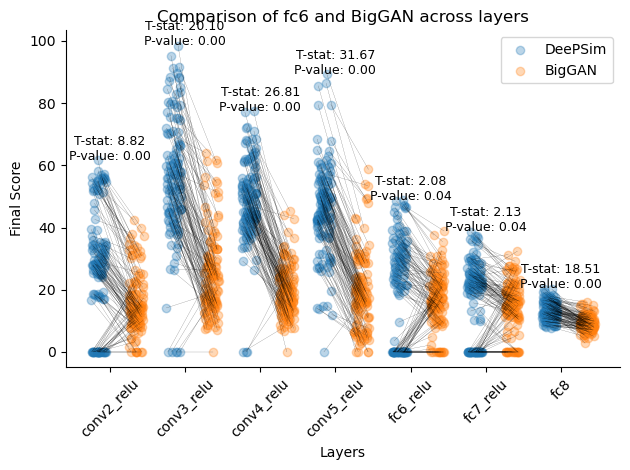

In [22]:
import scipy.stats as stats
plt.figure()
layer_names = [layerkey for layerkey in pivot_table.index.levels[0]]  # Collect layer names
for i, layerkey in enumerate(pivot_table.index.levels[0]):
    part_df = pivot_table[pivot_table.index.get_level_values(0) == layerkey]
    x_jitter = i * np.ones(part_df.shape[0]) + np.random.rand(part_df.shape[0]) * 0.2
    plt.scatter(x_jitter, part_df.fc6, c="C0", alpha=0.3, label="DeePSim" if i==0 else None)
    plt.scatter(x_jitter+0.5, part_df.BigGAN, c="C1", alpha=0.3, label="BigGAN" if i==0 else None)
    t_statistic, p_value = stats.ttest_rel(part_df.fc6, part_df.BigGAN, nan_policy="omit")
    x_jitter_arr = np.stack([x_jitter, x_jitter+0.5], axis=1)
    plt.plot(x_jitter_arr.T, part_df[["fc6", "BigGAN"]].values.T, c="k", lw=0.1)
    y_position = np.nanmax(part_df[['fc6', 'BigGAN']].values) + 0.1  # Adjust y_position based on your data range
    print(y_position)
    plt.text(i + 0.25, y_position, f'T-stat: {t_statistic:.2f}\nP-value: {p_value:.2f}', fontsize=9, ha='center')

plt.xticks(np.arange(len(layer_names)) + 0.25, labels=layer_names, rotation=45)  # Adjust rotation for better readability
plt.legend()
plt.xlabel('Layers')
plt.ylabel('Final Score')
plt.title('Comparison of fc6 and BigGAN across layers')
plt.tight_layout()
plt.show()

In [40]:
(pivot_table.fc6 < 0.1).mean()

0.136

In [46]:
(pivot_table.fc6 < 0.1).values.mean()

0.136

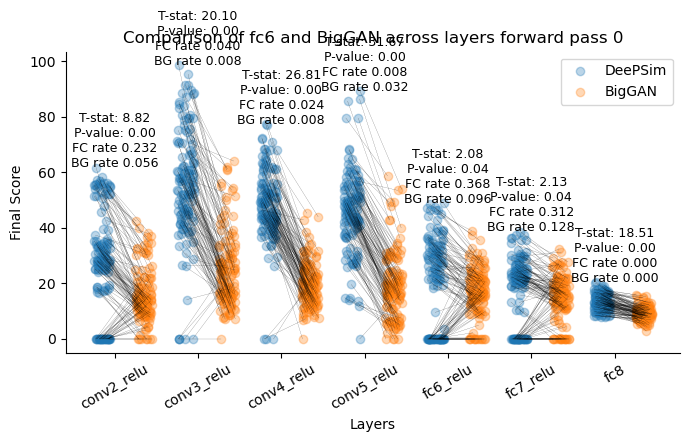

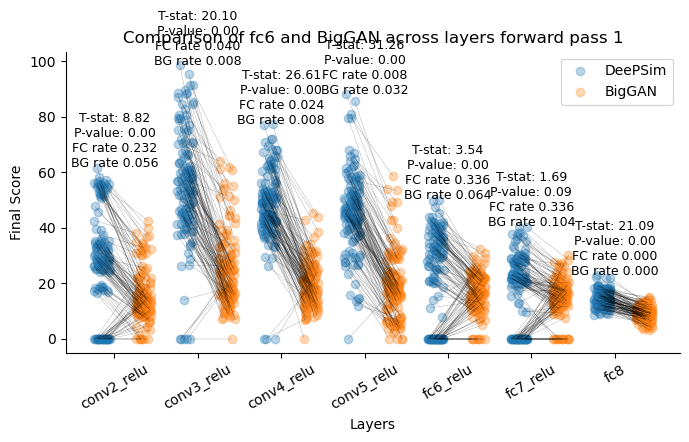

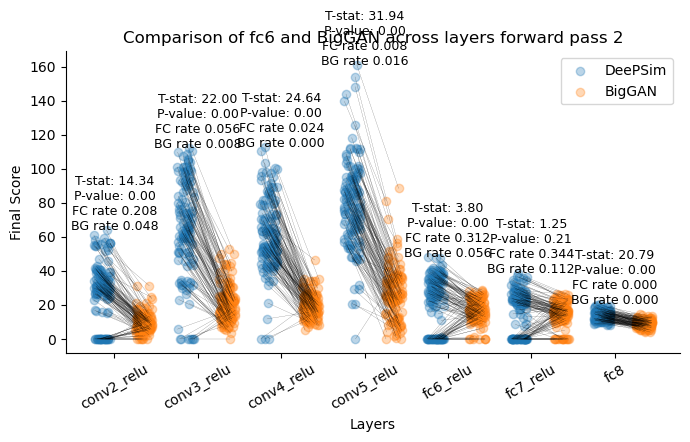

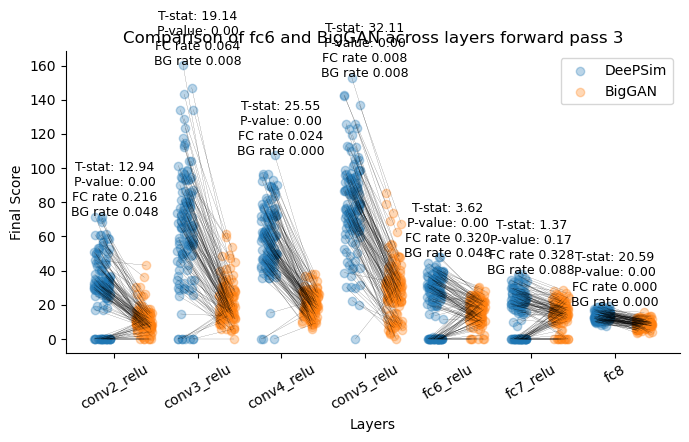

In [23]:
import scipy.stats as stats
for iT in range(4):
    pivot_table = score_df.pivot(index=['layer',"iCh","iRND"], columns='GANname', values=f'score_T{iT}')
    
    plt.figure(figsize=[7,4.5])
    layer_names = [layerkey for layerkey in pivot_table.index.levels[0]]  # Collect layer names
    for i, layerkey in enumerate(pivot_table.index.levels[0]):
        part_df = pivot_table[pivot_table.index.get_level_values(0) == layerkey]
        BigGAN_sucs_rate = (part_df.BigGAN < 0.1).mean()
        DeePSim_sucs_rate = (part_df.fc6 < 0.1).mean()
        x_jitter = i * np.ones(part_df.shape[0]) + np.random.rand(part_df.shape[0]) * 0.2
        plt.scatter(x_jitter, part_df.fc6, c="C0", alpha=0.3, label="DeePSim" if i==0 else None)
        plt.scatter(x_jitter+0.5, part_df.BigGAN, c="C1", alpha=0.3, label="BigGAN" if i==0 else None)
        t_statistic, p_value = stats.ttest_rel(part_df.fc6, part_df.BigGAN, nan_policy="omit")
        x_jitter_arr = np.stack([x_jitter, x_jitter+0.5], axis=1)
        plt.plot(x_jitter_arr.T, part_df[["fc6", "BigGAN"]].values.T, c="k", lw=0.1)
        y_position = np.nanmax(part_df[['fc6', 'BigGAN']].values) + 0.1  # Adjust y_position based on your data range
        # print(y_position)
        plt.text(i + 0.25, y_position, f'T-stat: {t_statistic:.2f}\nP-value: {p_value:.2f}\nFC rate {DeePSim_sucs_rate:.3f}\nBG rate {BigGAN_sucs_rate:.3f}', fontsize=9, ha='center')
    
    plt.xticks(np.arange(len(layer_names)) + 0.25, labels=layer_names, rotation=30)  # Adjust rotation for better readability
    plt.legend()
    plt.xlabel('Layers')
    plt.ylabel('Final Score')
    plt.title(f'Comparison of fc6 and BigGAN across layers forward pass {iT}')
    plt.tight_layout()
    plt.show()
        

In [ ]:
sns.stripplot(data=score_df, x="layer", y="score_T3", hue="GANname", dodge=True, alpha=0.6)

#### 

In [25]:
!ls {syndir}

alexnet_lrm1_df_img.pkl  alexnet_lrm3_df_img.pkl
alexnet_lrm2_df_img.pkl  figsummary


In [27]:
!ls

In [35]:
from core.utils.plot_utils import saveallforms
figdir = join(syndir, "figsummary")

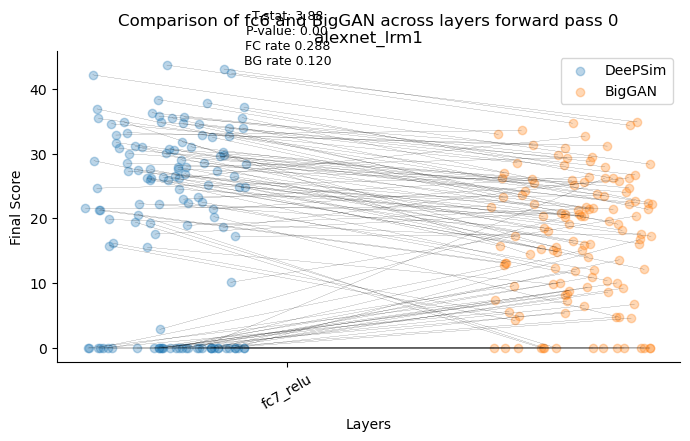

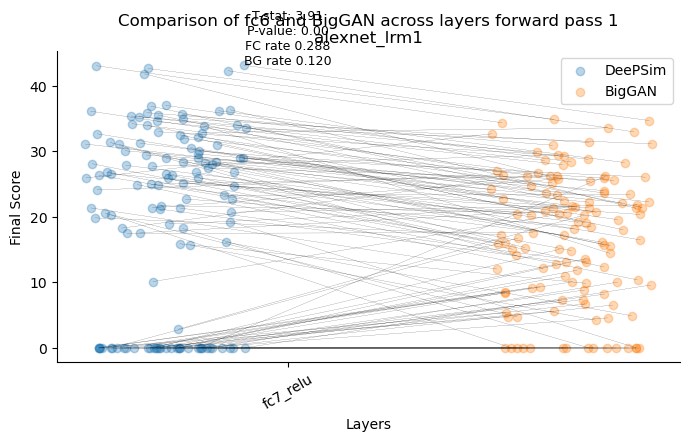

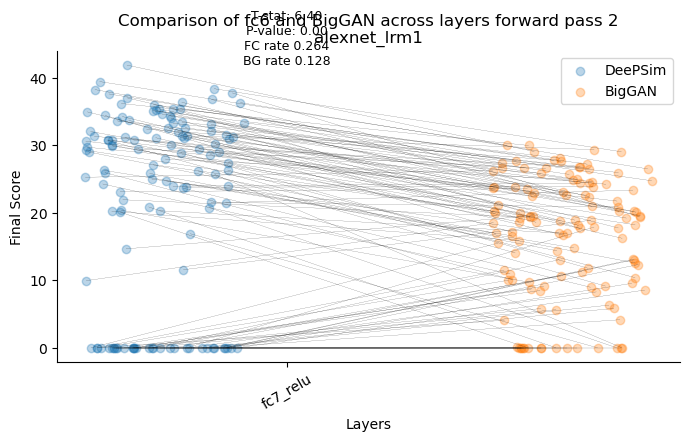

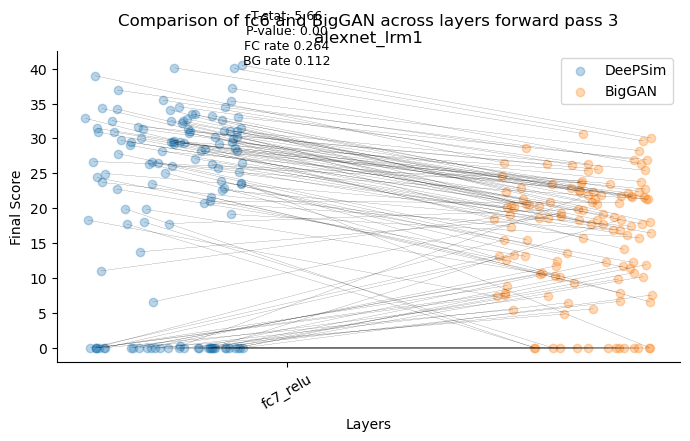

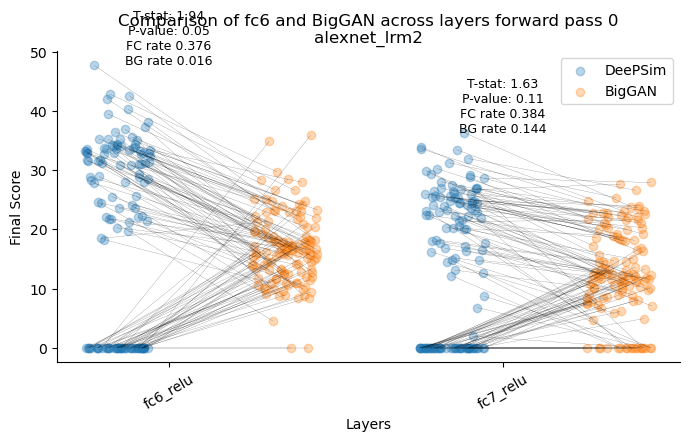

...

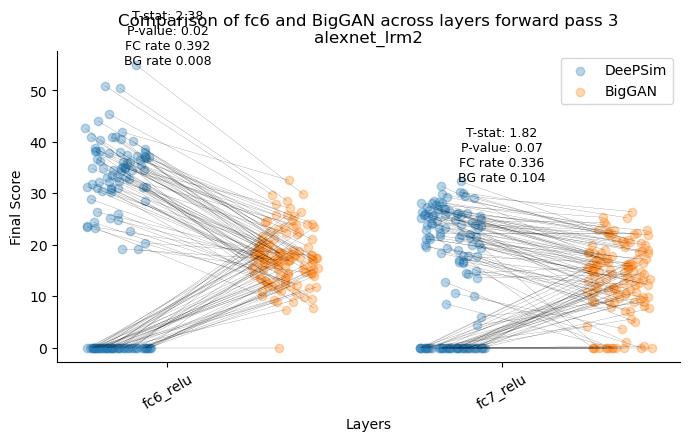

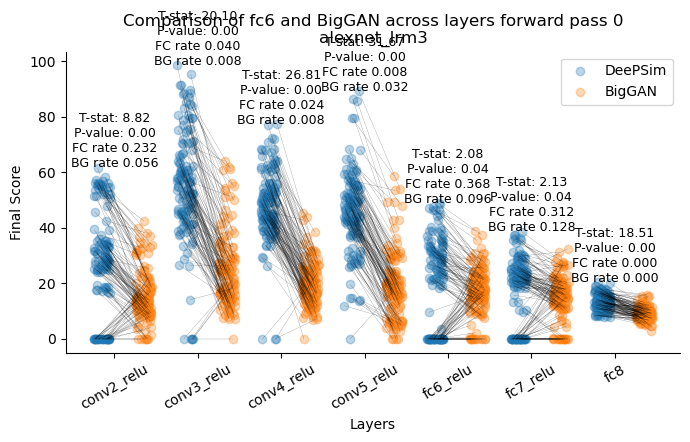

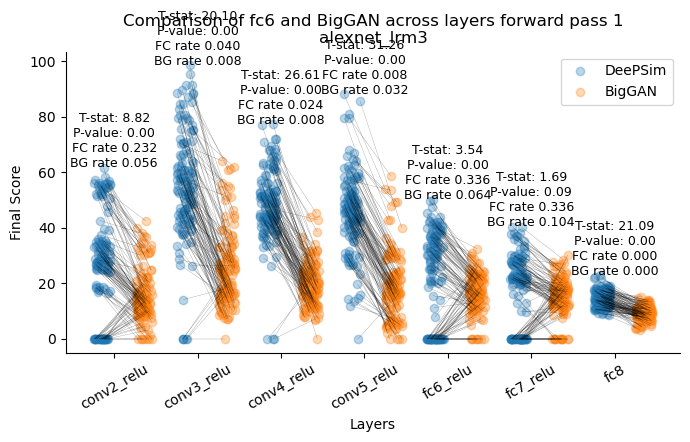

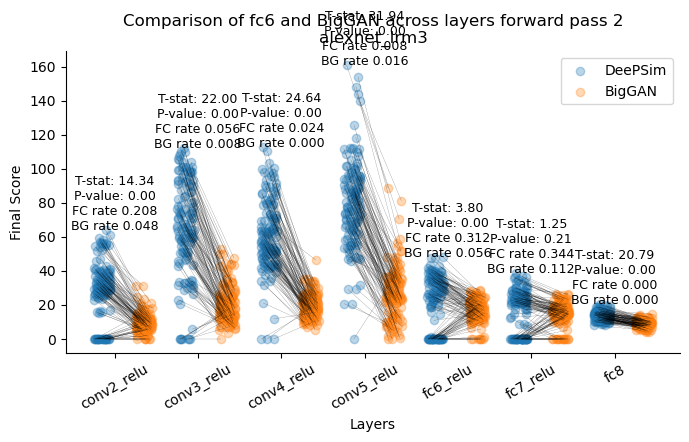

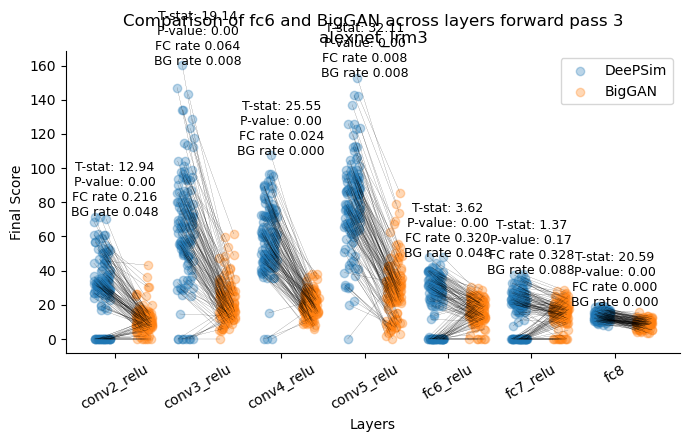

In [36]:
import scipy.stats as stats
netname = "alexnet_lrm3"
for netname in ["alexnet_lrm1", "alexnet_lrm2", "alexnet_lrm3"]:
    df_img = pd.read_pickle(join(syndir, f"{netname}_df_img.pkl"))

    score_df_col = []
    for layerkey in df_img.layerkey.unique():
        for iCh in range(25):
            df_unit_all = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                    (df_img.iT == iT)]
            for j, GANname in enumerate(["fc6", "BigGAN"]):
                fix_RND_list = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                    (df_img.iT == 0) & (df_img.GANname == GANname)].RND
                # if len(fix_RND_list) > 5:
                #     continue
                for iRND in range(5):
                    row_dict = {"layer":layerkey, "iCh":iCh, "iRND":iRND, "GANname": GANname}
                    fix_RND = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                    (df_img.iT == 0) & (df_img.GANname == GANname)].RND.values[iRND]
                    for i, iT in enumerate([0, 1, 2, 3]):
                        df_unit = df_img[(df_img.layerkey == layerkey) & (df_img.iChannel == iCh) & \
                                    (df_img.iT == iT) & (df_img.GANname == GANname)]
                        df_part = df_unit[df_unit.RND == fix_RND].iloc[0]
                        final_score = df_part.mean_score[-1,iT]
                        row_dict[f"score_T{iT}"] = final_score
                    score_df_col.append(row_dict)

    score_df = pd.DataFrame(score_df_col)

    for iT in range(4):
        pivot_table = score_df.pivot(index=['layer',"iCh","iRND"], columns='GANname', values=f'score_T{iT}')
        plt.figure(figsize=[7,4.5])
        layer_names = [layerkey for layerkey in pivot_table.index.levels[0]]  # Collect layer names
        for i, layerkey in enumerate(pivot_table.index.levels[0]):
            part_df = pivot_table[pivot_table.index.get_level_values(0) == layerkey]
            BigGAN_sucs_rate = (part_df.BigGAN < 0.1).mean()
            DeePSim_sucs_rate = (part_df.fc6 < 0.1).mean()
            x_jitter = i * np.ones(part_df.shape[0]) + np.random.rand(part_df.shape[0]) * 0.2
            plt.scatter(x_jitter, part_df.fc6, c="C0", alpha=0.3, label="DeePSim" if i==0 else None)
            plt.scatter(x_jitter+0.5, part_df.BigGAN, c="C1", alpha=0.3, label="BigGAN" if i==0 else None)
            t_statistic, p_value = stats.ttest_rel(part_df.fc6, part_df.BigGAN, nan_policy="omit")
            x_jitter_arr = np.stack([x_jitter, x_jitter+0.5], axis=1)
            plt.plot(x_jitter_arr.T, part_df[["fc6", "BigGAN"]].values.T, c="k", lw=0.1)
            y_position = np.nanmax(part_df[['fc6', 'BigGAN']].values) + 0.1  # Adjust y_position based on your data range
            # print(y_position)
            plt.text(i + 0.25, y_position, f'T-stat: {t_statistic:.2f}\nP-value: {p_value:.2f}\nFC rate {DeePSim_sucs_rate:.3f}\nBG rate {BigGAN_sucs_rate:.3f}', fontsize=9, ha='center')
        
        plt.xticks(np.arange(len(layer_names)) + 0.25, labels=layer_names, rotation=30)  # Adjust rotation for better readability
        plt.legend()
        plt.xlabel('Layers')
        plt.ylabel('Final Score')
        plt.title(f'Comparison of fc6 and BigGAN across layers forward pass {iT}\n{netname}')
        plt.tight_layout()
        saveallforms(figdir, f"{netname}-fc6_BigGAN_forward_pass_cmp_T{iT}", plt.gcf())
        plt.show()
        

### File Management 

In [10]:
if False:
    from pathlib import Path
    import datetime
    saveroot = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp"
    today = datetime.date.today()
    for subdir, dirs, files in os.walk(saveroot):
        cnt = 0
        # Check if the current subdir has the desired prefix
        if Path(subdir).name.startswith("alexnet_lrm3-fc6_relu"):
            for file in files:
                file_path = Path(subdir) / file
                creation_time = datetime.date.fromtimestamp(os.path.getctime(file_path))
                if creation_time == today:
                    os.remove(file_path)
                    print(f"Deleted: {file_path}")
                    cnt +=1
            print(subdir, cnt)

/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-fc6_relu-Ch0000 0
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-fc6_relu-Ch0018 0
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-fc6_relu-Ch0013 0
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-fc6_relu-Ch0019 0
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-fc6_relu-Ch0020 0
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-fc6_relu-Ch0009 0
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-fc6_relu-Ch0005 0
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-fc6_relu-Ch0015 0
/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/Evol_lrm_GAN_cmp/alexnet_lrm3-fc6_relu-Ch0002 0
/n/holylabs/LABS/kempner_fellows/Users/binxuwa